Blibliotecas

In [69]:
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import time


# Distancia de Minkowski:
$$Minkowski(X,Y,p) = \left( \sum_{i=1}^{n} |x_i - y_i|^p \right)^{\frac{1}{p}}$$


In [2]:
def minkowski(x, y, p):
    return np.sum(np.abs(x-y)** p)**(1/p)

# 2-aproximativo

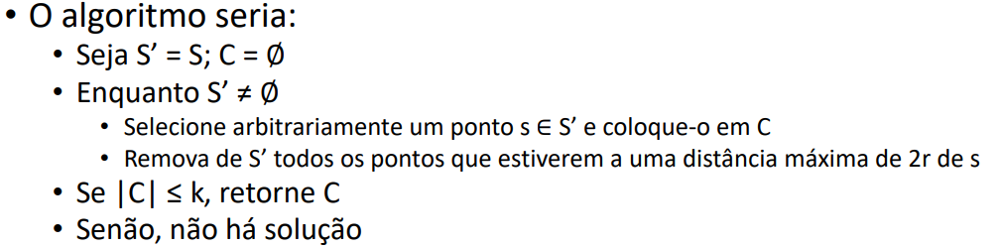


In [67]:
def two_approximation(S, k, r, dist_matrix):
    S_copy = S.copy()
    C = []
    while len(S_copy) > 0:
        s = S_copy[np.random.randint(len(S_copy))]
        C.append(s)
        S_copy = [point for point in S_copy if dist_matrix[np.where(S == point)[0][0]][np.where(S == s)[0][0]] > 2 * r]
    if len(C) <= k:
        return C
    else:
        return None

In [26]:
def refining_two_approximation(S, k, limit,dist_matrix):
    dim = 1 if type(S[0]) == int else len(S[0])
    rmax =  np.max([minkowski(S[i], S[j], dim) for i in range(len(S)) for j in range(i+1,len(S))])
    low, high = 0, rmax
    low_v = [low]
    high_v = [high]
    while high - low > limit*rmax:
        mid = (high+low)//2
        C = two_approximation(S, k, mid,dist_matrix)
        if C is not None:
            high = mid -1
        else:
            low = mid + 1
        high_v.append(high)
        low_v.append(low)
    return np.vstack(C), high_v, low_v
    

# 

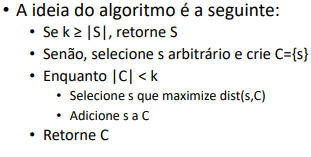

In [5]:
def distance_matrix(points, p=2):
    n = len(points)
    dist_matrix = np.zeros((n, n))
    
    for i in range(n):
        for j in range(i, n):
            dist = minkowski(points[i], points[j], p)
            dist_matrix[i][j] = dist
            dist_matrix[j][i] = dist
    
    return dist_matrix

In [6]:
def max_dist_point(dist_matrix, centers_indices):
    max_dist = -1
    max_index = None
    for i in range(len(dist_matrix)):
        if i not in centers_indices:
            min_dist = min(dist_matrix[i][j] for j in centers_indices)
            if min_dist > max_dist:
                max_dist = min_dist
                max_index = i
    return max_index

In [7]:
def k_centers_max_dist(points, k,dist_matrix):
    n = len(points)
    if k >= n:
        return points

    centers_indices = [np.random.choice(n)]

    while len(centers_indices) < k:
        new_center_index = max_dist_point(dist_matrix, centers_indices)
        centers_indices.append(new_center_index)

    centers = [points[i] for i in centers_indices]
    return np.vstack(centers)

In [8]:
def predict_points(points, centers):
    labels = []
    for p in points:
        dist = list(map(lambda x: minkowski(p,x,p=2),centers))
        idx = dist.index(min(dist))
        labels.append(idx)
    return np.vstack(labels)

Lembrar de Gerar a matriz de distancias antes de rodar

In [9]:
from data_generator_script import generate_synthetic_data, generate_scikit_synthetic_data

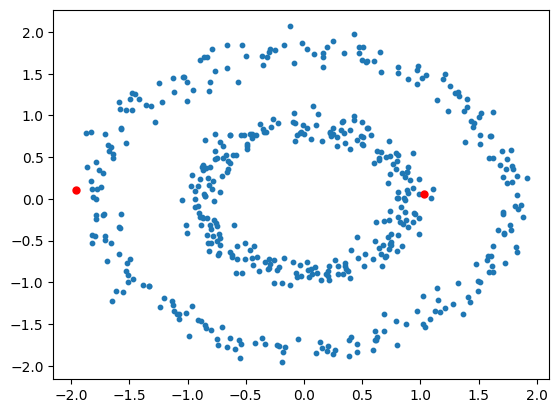

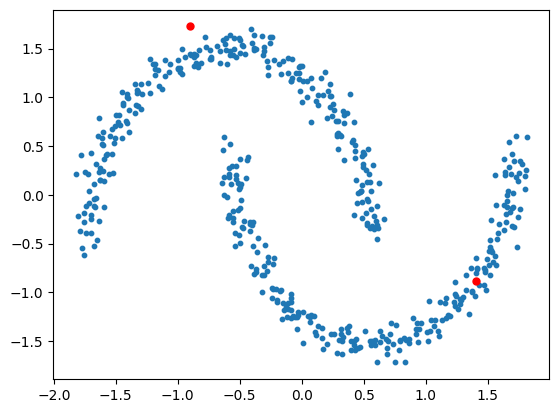

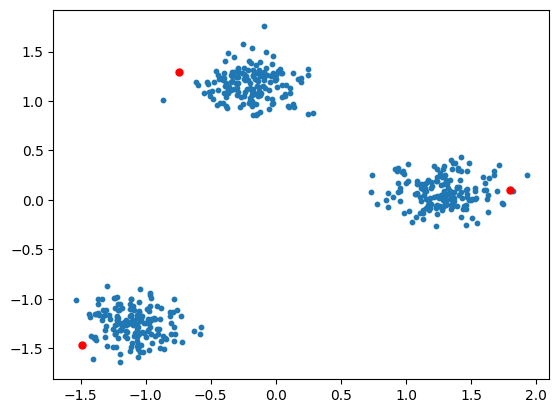

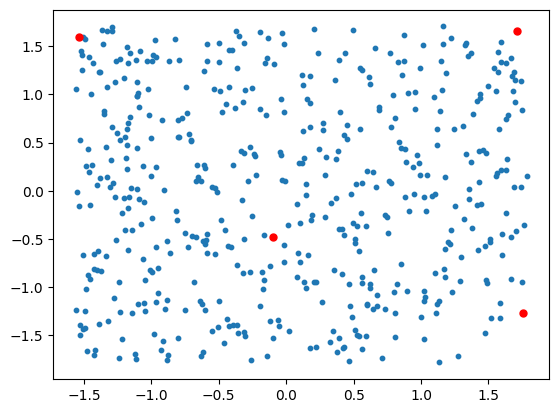

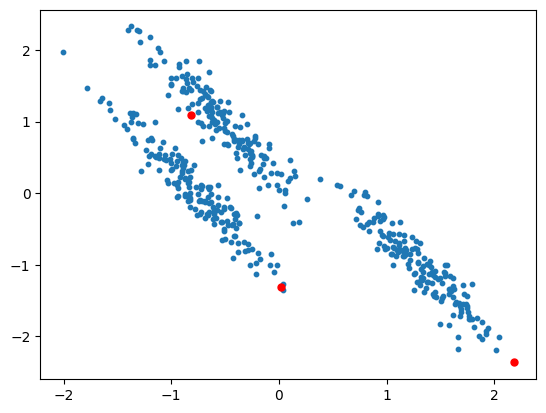

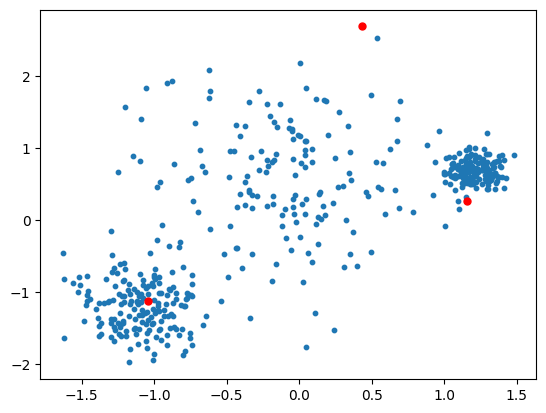

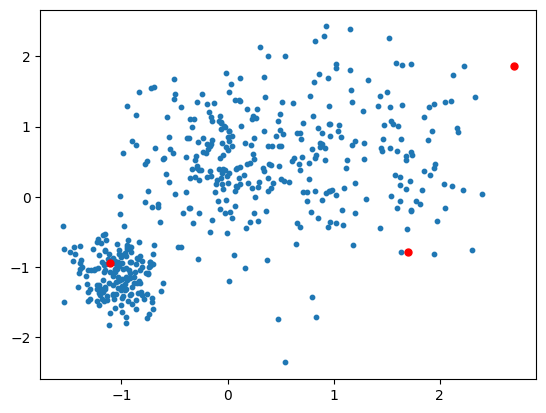

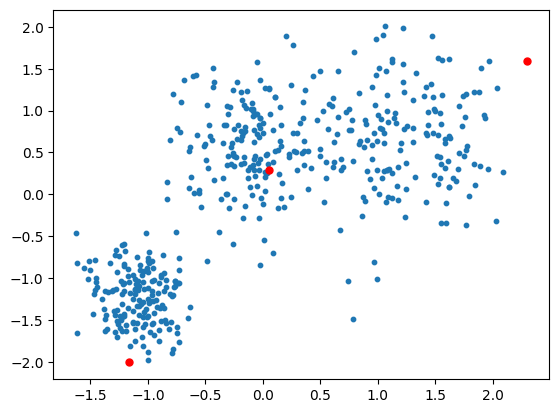

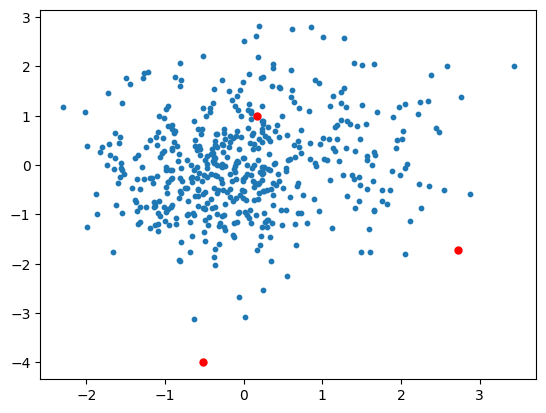

In [11]:
datasets = generate_scikit_synthetic_data()
k_data = [2, 2, 3, 4, 3, 3, 3, 3, 3]
for i, (X, y) in enumerate(datasets):
     X = StandardScaler().fit_transform(X)
     dist_mat = distance_matrix(X)
     centers =  k_centers_max_dist(X, k_data[i], dist_mat)
     plt.scatter(X[:,0], X[:,1], s=10)
     plt.scatter(centers[:,0], centers[:,1], color='red', s=100, marker='.')
     plt.show()

In [68]:
k_data = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
datasets = generate_synthetic_data(k_data, 700, [0.5, 2.5, 5])
duration = []
average_time =[]
for i, (data, true_labels, true_centers) in enumerate(datasets):
      tempo =0
      dist_matrix = distance_matrix(data)
      for j in range(30):
            t0 = time.time()
            centers, _,__ =  refining_two_approximation(data, k_data[i],0.25,dist_matrix)
            t1 = time.time()
            plt.figure(figsize=(10, 6))
            plt.scatter(data[:, 0], data[:, 1], s=10, alpha=0.7, label='Data')
            plt.scatter(centers[:, 0], centers[:, 1], color='red', marker='.', s=100, label='Centros Previstos')
            plt.scatter(true_centers[:, 0], true_centers[:, 1], color='yellow', marker='.', s=100, label='Centros dos Clusters')
            plt.text(
                  0.99,
                  0.01,
                  ("%.2fs" % (t1 - t0)).lstrip("0"),
                  transform=plt.gca().transAxes,
                  size=15,
                  horizontalalignment="right",
            )
            duration.append(t1 - t0)
            tempo += t1- t0
            plt.legend()
            plt.show()
      average_time.append(tempo/30)

KeyboardInterrupt: 

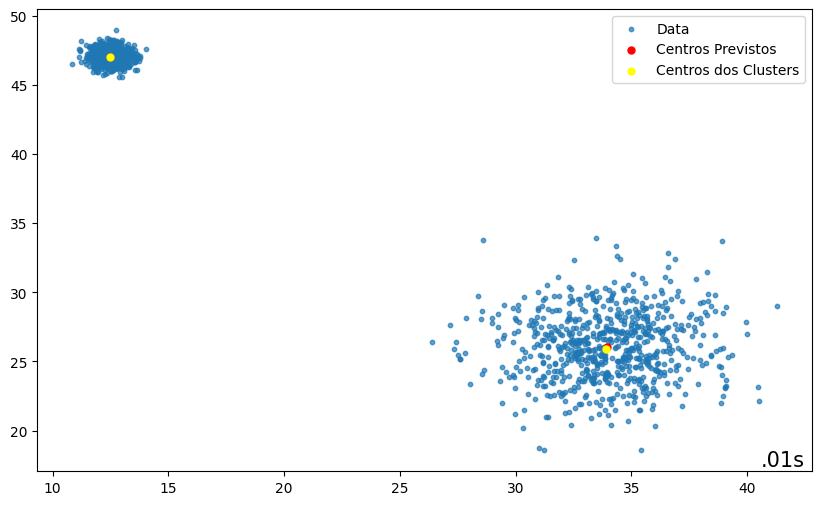

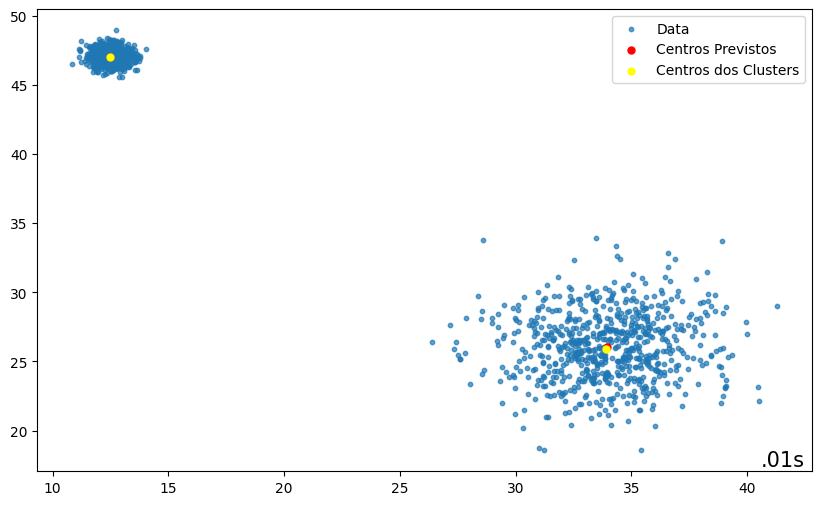

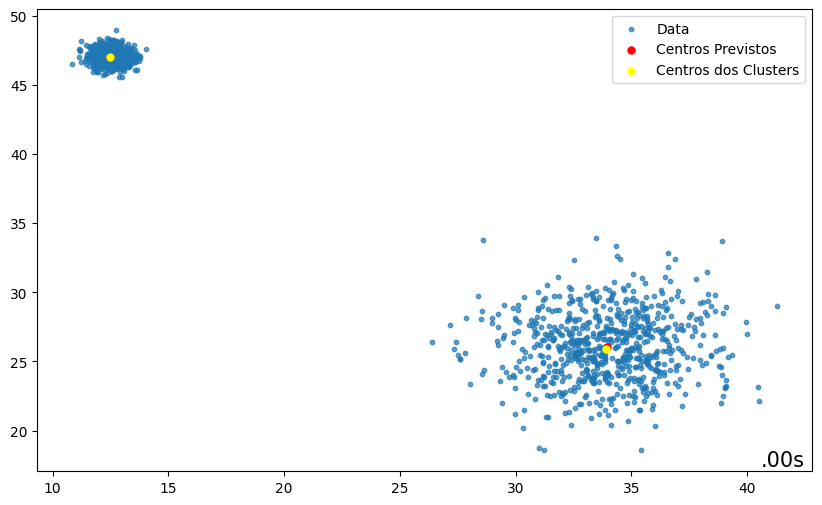

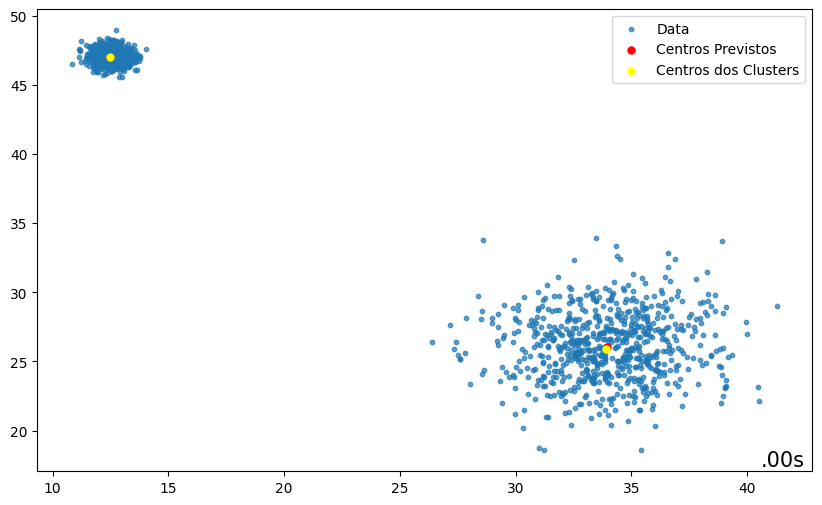

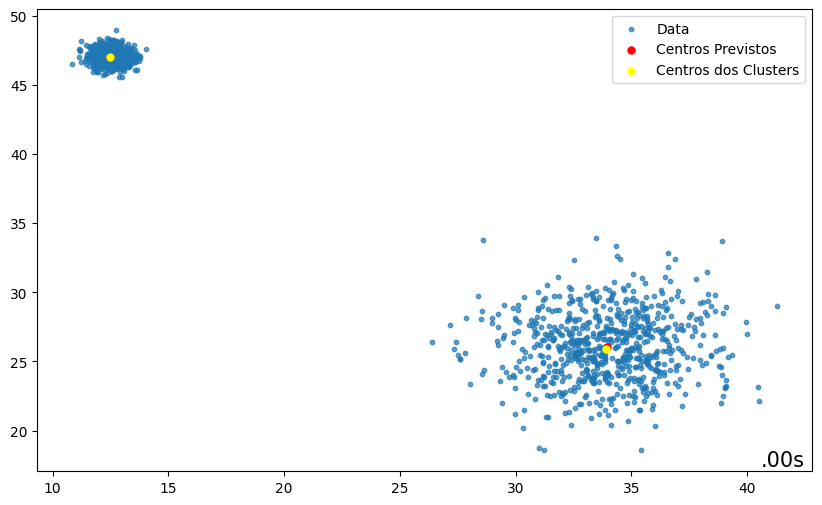

...

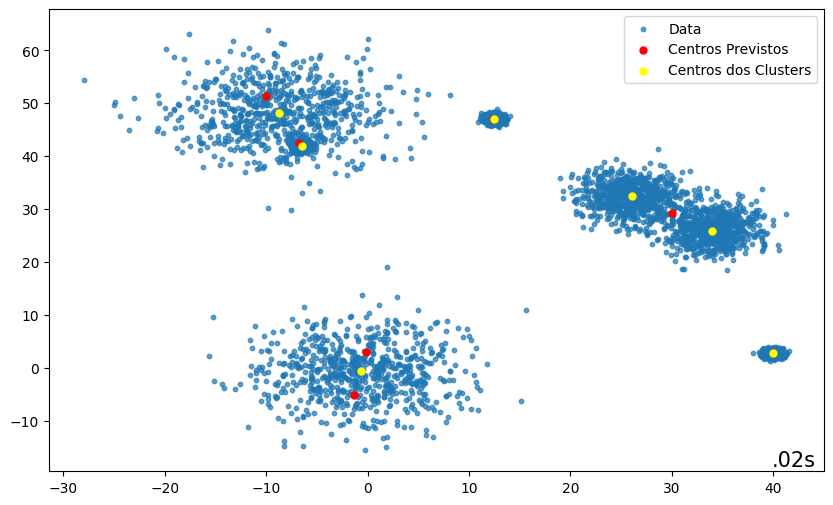

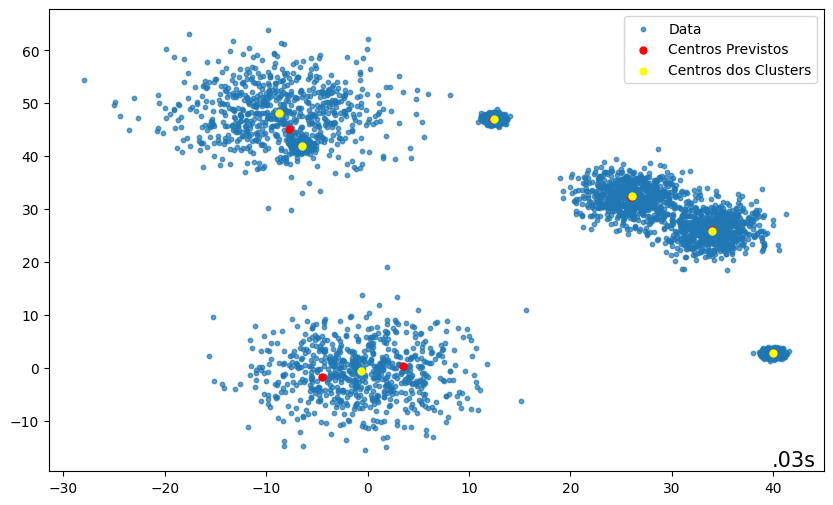

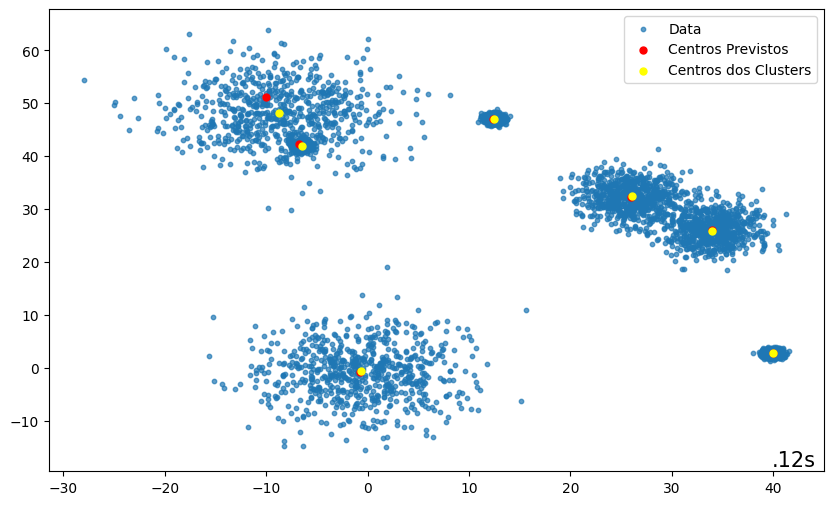

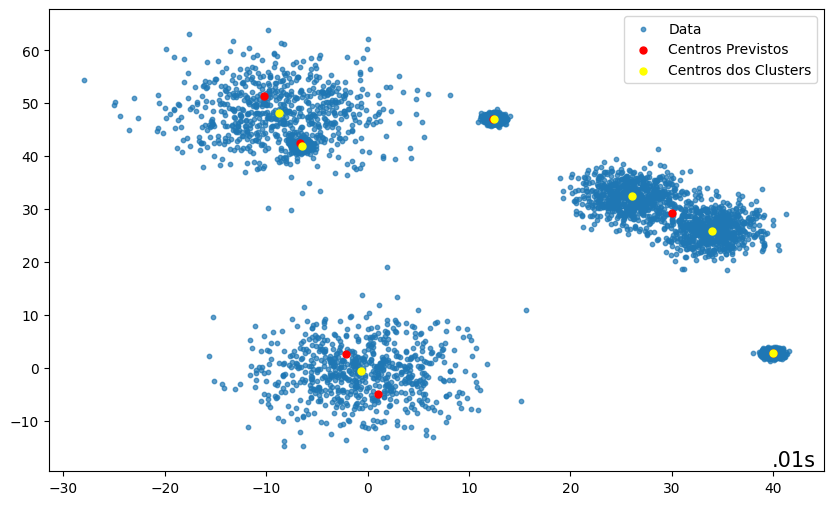

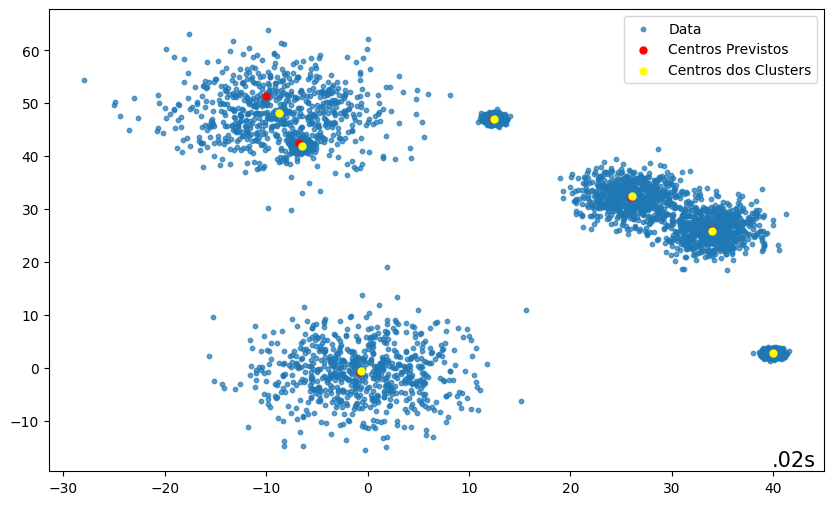

In [76]:
k_data = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
datasets = generate_synthetic_data(k_data, 700, [0.5, 2.5, 5])
duration = []
average_time =[]
for i, (data, true_labels, true_centers) in enumerate(datasets):
      tempo =0
      for j in range(30):
            t0 = time.time()
            kmeans = KMeans(n_clusters=k_data[i]).fit(data)
            predicted_centers = kmeans.cluster_centers_
            t1 = time.time()
            plt.figure(figsize=(10, 6))
            plt.scatter(data[:, 0], data[:, 1], s=10, alpha=0.7, label='Data')
            plt.scatter(predicted_centers[:, 0], predicted_centers[:, 1], color='red', marker='.', s=100, label='Centros Previstos')
            plt.scatter(true_centers[:, 0], true_centers[:, 1], color='yellow', marker='.', s=100, label='Centros dos Clusters')
            plt.text(
                  0.99,
                  0.01,
                  ("%.2fs" % (t1 - t0)).lstrip("0"),
                  transform=plt.gca().transAxes,
                  size=15,
                  horizontalalignment="right",
            )
            duration.append(t1 - t0)
            tempo += t1- t0
            plt.legend()
            plt.show()
      average_time.append(tempo/30)

In [ ]:
from itertools import cycle, islice
colors = np.array(
            list(
                islice(
                    cycle(
                        [
                            "#377eb8",
                            "#ff7f00",
                            "#4daf4a",
                            "#f781bf",
                            "#a65628",
                            "#984ea3",
                            "#999999",
                            "#e41a1c",
                            "#dede00",
                        ]
                    ),
                    int(max(labels) + 1),
                )
            )
        )

C:\Users\Gabriel\AppData\Local\Temp\ipykernel_9352\2793213386.py:18: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  int(max(labels) + 1),


In [ ]:
np.reshape((1,))

ValueError: 'c' argument must be a color, a sequence of colors, or a sequence of numbers, not array([['#f781bf'],
       ['#f781bf'],
       ['#f781bf'],
       ...,
       ['#999999'],
       ['#999999'],
       ['#999999']], dtype='<U7')

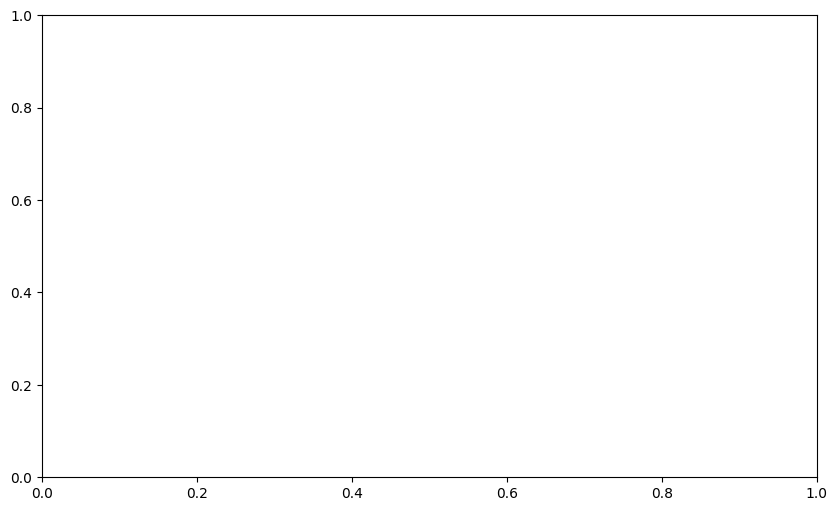

In [ ]:

labels = predict_points(data, centers)
plt.figure(figsize=(10, 6))
plt.scatter(data[:, 0], data[:, 1], s=10, alpha=0.7, label='Data', c=colors[labels])
plt.scatter(centers[:, 0], centers[:, 1], color='red', marker='.', s=100, label='Centros Previstos')
plt.scatter(true_centers[:, 0], true_centers[:, 1], color='yellow', marker='.', s=100, label='Centros dos Clusters')
# plt.text(
#     0.99,
#     0.01,
#     ("%.2fs" % (t1 - t0)).lstrip("0"),
#     transform=plt.gca().transAxes,
#     size=15,
#     horizontalalignment="right",
# )
# duration.append(t1 - t0)
plt.legend()
plt.show()

In [ ]:
labels

array([[3],
       [3],
       [3],
       ...,
       [6],
       [6],
       [6]])